# h5 extractor

## modules

In [1]:
# import modules

import os, glob, sys
import warnings
from timeit import default_timer as timer
import matplotlib.pyplot as plt
import pandas as pd
pd.options.mode.chained_assignment = None
import numpy as np
import geopandas as gp
import rasterio
import h5py

# import own functions 
sys.path.append('my_functions')
from ATL03_extractor import * 

## single file

### .h5 to .hdf (beam wise)

In [2]:
# Data extraction from ATL03 product (HDF5 formatted files)

# input: h5 file of ATL03 track data from NSIDC Data Access Tool
ATL03_input_path = '../data/tracks/ATL03/California/SAF/ATL03_20220901033738_10881602_005_01.h5'

# output: folder for processed h5 swath files
ATL03_output_path = '../data/tracks/ATL03/California/SAF/ATL03_20220901033738_10881602_005_01_SGM2/'

# region of interest (bounding box of ROI = clip mask of tracks)
ROI_fname = '../data/shapefiles/SHP_Cali/SHP_SAF/San_Gabriel_AOI.shp'
EPSG = 'epsg:32611' #EPSG:32611 - WGS 84 / UTM zone 11N (CA)

# create subsetted hdf5 files of each swath with SVDA extraction function (modified from Atmani, Bodo Bookhagen, and Smith, 2022)
ATL03_files = list(glob.glob(ATL03_input_path))
ATL03_files.sort()
for fname in ATL03_files:  
    ATL03_signal_photons(fname, ATL03_output_path, ROI_fname, EPSG, reprocess=True)

Opening ATL03_20220901033738_10881602_005_01.h5: gt1l
saved to ../data/tracks/ATL03/California/SAF/ATL03_20220901033738_10881602_005_01_SGM2/ATL03_Signal_20220901033738_gt1l.hdf

Opening ATL03_20220901033738_10881602_005_01.h5: gt1r
saved to ../data/tracks/ATL03/California/SAF/ATL03_20220901033738_10881602_005_01_SGM2/ATL03_Signal_20220901033738_gt1r.hdf

Opening ATL03_20220901033738_10881602_005_01.h5: gt2l
saved to ../data/tracks/ATL03/California/SAF/ATL03_20220901033738_10881602_005_01_SGM2/ATL03_Signal_20220901033738_gt2l.hdf

Opening ATL03_20220901033738_10881602_005_01.h5: gt2r
saved to ../data/tracks/ATL03/California/SAF/ATL03_20220901033738_10881602_005_01_SGM2/ATL03_Signal_20220901033738_gt2r.hdf

Opening ATL03_20220901033738_10881602_005_01.h5: gt3l
saved to ../data/tracks/ATL03/California/SAF/ATL03_20220901033738_10881602_005_01_SGM2/ATL03_Signal_20220901033738_gt3l.hdf

Opening ATL03_20220901033738_10881602_005_01.h5: gt3r
saved to ../data/tracks/ATL03/California/SAF/ATL03_

### load all .hdf files

In [2]:
# output: folder for processed h5 swath files
ATL03_output_path = '../data/tracks/ATL03/California/SAF/ATL03_20220901033738_10881602_005_01_SGM2/'

# load in extracted hdf files of all ground tracks
ATL03_land_files = glob.glob(os.path.join(ATL03_output_path, 'ATL03_*.hdf'))
# sorts by date (oldest first, latest last)
ATL03_land_files.sort()

# set up a dataframe list and fill with dataframes of each individual ground track (6 total)
ATL03_list = []
for i in range(len(ATL03_land_files)):
    ATL03_df = pd.read_hdf(ATL03_land_files[i], mode='r')
    ATL03_df = ATL03_df.sort_values(by=['alongtrack'], ascending=True).reset_index()
    ATL03_list.append(ATL03_df)

# define names of beams
tracknames = ['GT1L', 'GT1R', 'GT2L', 'GT2R', 'GT3L', 'GT3R']

In [4]:
ATL03_list[5]

,index,Latitude,Longitude,Photon_Height,Land,Easting,Northing,crosstrack,alongtrack,alongtrack_base
0,1400608,34.184905,-117.942545,941.778870,4.0,413145.582916,3.783060e+06,-23721.295079,799926.966066,0.000000
1,1400607,34.184918,-117.942451,2437.884277,-2.0,413154.254276,3.783061e+06,-23712.548121,799927.741247,0.775181
2,1400609,34.184924,-117.942547,950.171204,4.0,413145.443857,3.783062e+06,-23721.284261,799929.109472,2.143406
3,1400610,34.184930,-117.942548,942.546448,4.0,413145.338412,3.783062e+06,-23721.341311,799929.803690,2.837624
4,1400611,34.184930,-117.942548,945.047119,4.0,413145.352592,3.783062e+06,-23721.326752,799929.808605,2.842539
...,...,...,...,...,...,...,...,...,...,...
171735,1572345,34.690701,-118.001333,705.052612,4.0,408282.553435,3.839200e+06,-24647.517762,856270.015597,56343.049531
171736,1572342,34.690701,-118.001333,705.190918,4.0,408282.554212,3.839200e+06,-24647.516964,856270.015869,56343.049803
171737,1572344,34.690701,-118.001333,705.198303,4.0,408282.554254,3.839200e+06,-24647.516922,856270.015883,56343.049817
171738,1572343,34.690701,-118.001333,705.287292,4.0,408282.554754,3.839200e+06,-24647.516408,856270.016058,56343.049992


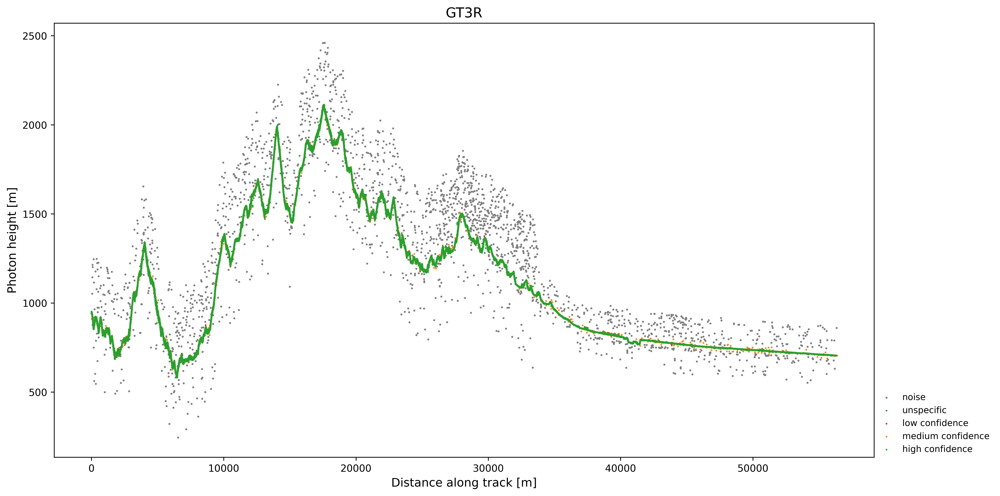

In [5]:
fig, ax = plt.subplots(1,1, figsize=(15,8))
fig.set_dpi(600)
q = 5
ax.scatter(ATL03_list[q]['alongtrack_base'][ATL03_list[q]['Land'] == 0],  ATL03_list[q]['Photon_Height'][ATL03_list[q]['Land'] == 0], s=1, c='grey', label='noise')
ax.scatter(ATL03_list[q]['alongtrack_base'][ATL03_list[q]['Land'] == -1], ATL03_list[q]['Photon_Height'][ATL03_list[q]['Land'] == -1], s=0.5, label='unspecific', c='tab:blue')
ax.scatter(ATL03_list[q]['alongtrack_base'][ATL03_list[q]['Land'] == 2],  ATL03_list[q]['Photon_Height'][ATL03_list[q]['Land'] == 2],  s=0.5, label='low confidence', c='tab:red')
ax.scatter(ATL03_list[q]['alongtrack_base'][ATL03_list[q]['Land'] == 3],  ATL03_list[q]['Photon_Height'][ATL03_list[q]['Land'] == 3],  s=0.5, label='medium confidence', c='tab:orange')
ax.scatter(ATL03_list[q]['alongtrack_base'][ATL03_list[q]['Land'] == 4],  ATL03_list[q]['Photon_Height'][ATL03_list[q]['Land'] == 4],  s=0.5, label='high confidence', c='tab:green')
# ax.set_xlim(20000,23000)
# ax.set_ylim(10,50)
ax.set_title(tracknames[q], fontsize=14)
ax.set_ylabel('Photon height [m]', fontsize=12)
ax.set_xlabel('Distance along track [m]', fontsize=12)
ax.legend(loc=(1.0, 0), frameon=False, fontsize=9);

In [4]:
import plotly
import plotly.express as px
import plotly.graph_objects as go
fig1 = px.scatter_mapbox(ATL03_list[5], 
                        lat='Latitude', 
                        lon='Longitude',
                        color='Photon_Height', zoom=9)

fig1.update_layout(mapbox_style="open-street-map")

fig1.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig1.show();

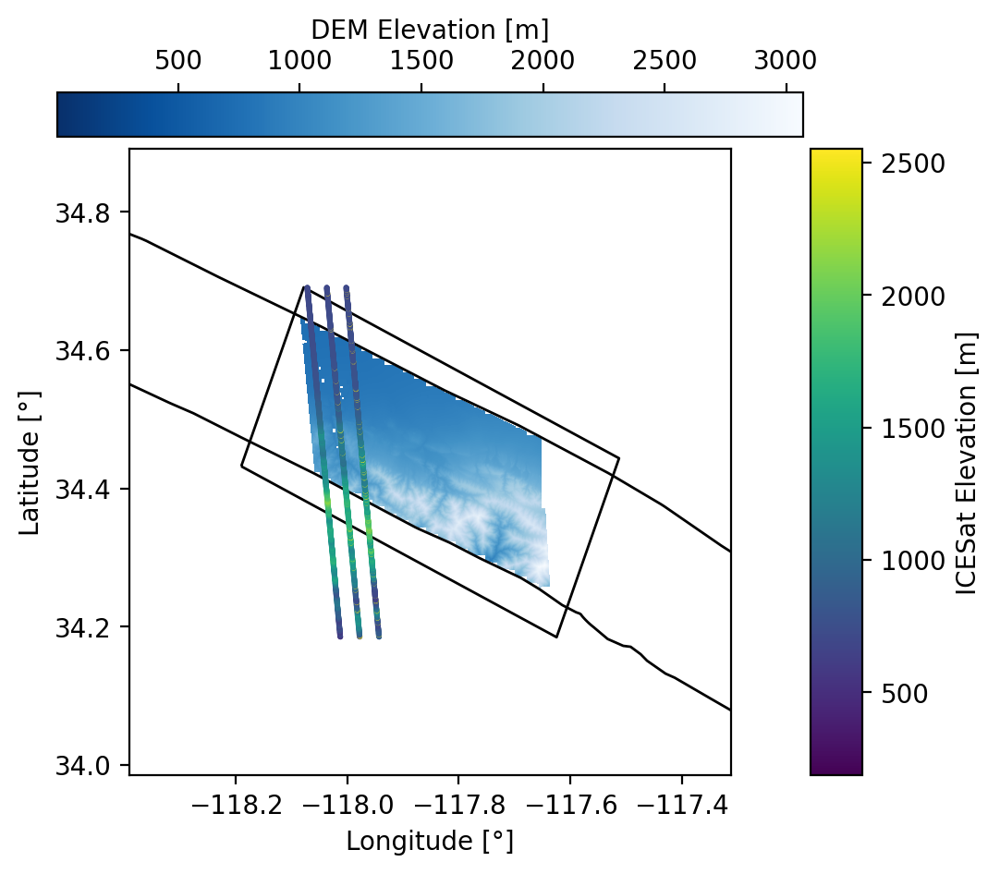

In [5]:
fig, ax = plt.subplots()
fig.set_dpi(200)
min_ph = []
max_ph = []
for i in range(6):
    max_ph.append(ATL03_list[i].Photon_Height.max())
    min_ph.append(ATL03_list[i].Photon_Height.min())

src_sn = rasterio.open('../data/DEMs/DEMs_Cali/DEMs_SAF/SGM_AOI_4326_1m.tif')
array_SAF10 = src_sn.read(1)
array_SAF10[array_SAF10 <= 0] = np.nan
array_SAF10 = array_SAF10[::10,::10]
dem = ax.imshow(np.flip(array_SAF10, axis=0), origin='lower', extent=(src_sn.bounds[0], src_sn.bounds[2], src_sn.bounds[1], src_sn.bounds[3]), cmap='Blues_r')

shape = gp.read_file('../data/shapefiles/SHP_Cali/SHP_SAF/San_Gabriel_AOI.shp')
shape.plot(ax=ax, facecolor="none", edgecolor='black', markersize=2);
saf = gp.read_file('../data/shapefiles/SHP_Cali/SHP_SAF/San_Andreas_BB/SAF_fault_WGS84_10km_buffer.shp')
saf.plot(ax=ax, facecolor="none", edgecolor='black', markersize=2);

for i in range(6):
    el = ax.scatter(ATL03_list[i].Longitude[50::100], ATL03_list[i].Latitude[50::100], s=1, c=ATL03_list[i].Photon_Height[50::100], vmin=np.nanmin(min_ph), vmax=np.nanmax(max_ph))
ax.set_ylim(shape.envelope.bounds.miny[0]-0.2,shape.envelope.bounds.maxy[0]+0.2);
ax.set_xlim(shape.envelope.bounds.minx[0]-0.2,shape.envelope.bounds.maxx[0]+0.2);
ax.set_xlabel('Longitude [°]')
ax.set_ylabel('Latitude [°]');

from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
ax1_divider = make_axes_locatable(ax)
cax1 = ax1_divider.append_axes("right", size="7%", pad="1%")
cb1 = fig.colorbar(el, cax=cax1, label='ICESat Elevation [m]')

cax2 = ax1_divider.append_axes("top", size="7%", pad="2%")
cb2 = fig.colorbar(dem, cax=cax2, orientation='horizontal', label='DEM Elevation [m]')
cax2.xaxis.set_ticks_position("top")
cax2.xaxis.set_label_position('top')